# Performs forward prediction on single image files using ImageNet pre-trained image classification models.

In [1]:
!pip install numpy pandas matplotlib requests tqdm opencv-python pillow gc -i 


Usage:   
  pip install [options] <requirement specifier> [package-index-options] ...
  pip install [options] -r <requirements file> [package-index-options] ...
  pip install [options] [-e] <vcs project url> ...
  pip install [options] [-e] <local project path> ...
  pip install [options] <archive url/path> ...

-i option requires 1 argument


In [2]:
!pip3 install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple, https://download.pytorch.org/whl/cu113


In [3]:
!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/meta_data/imagenet_class_index.csv

--2024-02-25 23:28:05--  https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/meta_data/imagenet_class_index.csv
Connecting to 172.16.0.13:5848... connected.
Proxy request sent, awaiting response... 200 OK
Length: 37074 (36K) [text/csv]
Saving to: ‘imagenet_class_index.csv.1’

imagenet_class_inde 100%[===================>]  36.21K  --.-KB/s    in 0.05s   

2024-02-25 23:28:06 (689 KB/s) - ‘imagenet_class_index.csv.1’ saved [37074/37074]



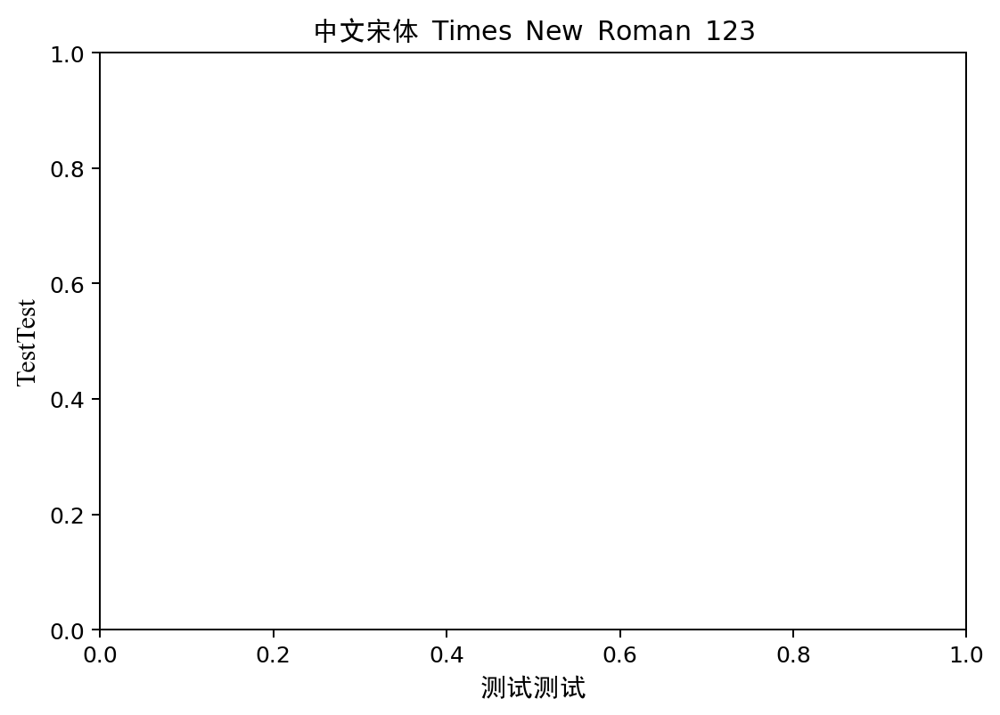

In [4]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.font_manager import FontProperties
 
# Global Font Settings
SimSun = FontProperties(fname='/home/featurize/SimHei.ttf')  # Used to display Chinese labels normally
plt.rcParams['axes.unicode_minus'] = False  # Used to display the negative sign normally
Times_New_Roman = FontProperties(fname='/home/featurize/times.ttf')
 
# mixed font settings
config = {
#     "font.family":'serif',
#     "font.size": 80,
       "mathtext.fontset":'stix',
#     "font.serif": ['SimSun'],
}
rcParams.update(config)
 
#画布设置
fig = plt.figure(num=1, figsize=(9, 6),dpi=180)
ax = plt.axes((0.23,0.23,0.6,0.6))
 
ax.set_title('中文宋体 $\mathrm{Times}$ $\mathrm{New}$ $\mathrm{Roman}$ $\mathrm{123}$'\
                                           ,fontproperties=SimSun,fontsize=12)  #Mixed Chinese and English fonts
 
ax.set_xlabel('测试测试',fontproperties=SimSun,fontsize=12)                      #Chinese Song font only
 
ax.set_ylabel('TestTest',fontproperties=Times_New_Roman,fontsize=12)            #New Rome in English only
 
 
plt.show()

In [5]:
#创建目录

In [6]:
import os

In [7]:
# Store test images
os.mkdir('test_img')

# Storing the results file
os.mkdir('output')

In [11]:
import cv2
img_cv   = cv2.imread("/home/featurize/test_img/husky1.jpeg")#retrieve data
img_cv   = cv2.imread("/home/featurize/test_img/cat1.jpg")
img_cv   = cv2.imread("/home/featurize/test_img/cat_dog.jpg")
img_cv   = cv2.imread("/home/featurize/test_img/banana1.jpg")
img_cv   = cv2.imread("/home/featurize/test_img/watermelon1.jpg")


In [12]:
import os

import cv2

import pandas as pd
import numpy as np

import torch

import matplotlib.pyplot as plt
%matplotlib inline

##  computing device

In [13]:
# GPU if you have one, CPU if you don't.
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [14]:
from torchvision import models

##  Load pre-trained image classification model

In [15]:
model = models.resnet18(pretrained=True) 

# model = models.resnet152(pretrained=True)

/environment/miniconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/environment/miniconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /home/featurize/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 304MB/s]


In [16]:
model = model.eval()
model = model.to(device)

## Image pre-processing

In [17]:
from torchvision import transforms

# Test Set Image Preprocessing - RCTN: Scaling Cropping, Turn Tensor, Normalisation
test_transform = transforms.Compose([transforms.Resize(256),
                                     transforms.CenterCrop(224),
                                     transforms.ToTensor(),
                                     transforms.Normalize(
                                         mean=[0.485, 0.456, 0.406], 
                                         std=[0.229, 0.224, 0.225])
                                    ])

## Load a test image

In [18]:
# img_path = 'test_img/banana1.jpg'
img_path = 'test_img/husky1.jpeg'
#img_path = 'test_img/basketball_shoe.jpeg'

# img_path = 'test_img/cat_dog.jpg'

In [19]:
# Loading from pillow
from PIL import Image
img_pil = Image.open(img_path)

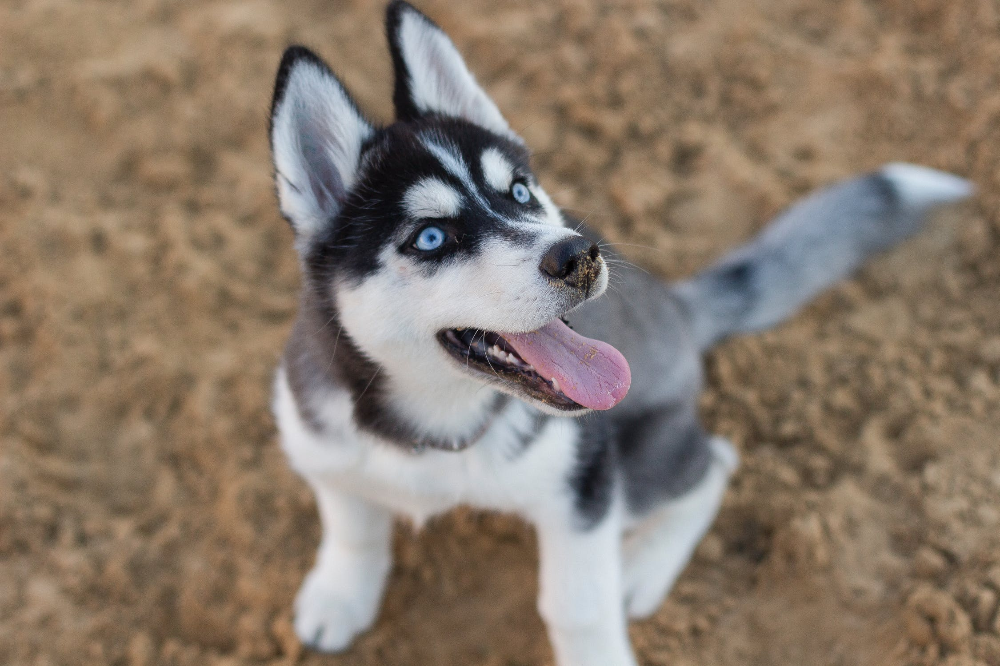

In [21]:
img_pil

In [22]:
np.array(img_pil).shape

(1500, 2250, 3)

# Perform image classification prediction

In [23]:
input_img = test_transform(img_pil) # 预处理

In [24]:
input_img.shape

torch.Size([3, 224, 224])

In [25]:
input_img = input_img.unsqueeze(0).to(device)

In [26]:
input_img.shape

torch.Size([1, 3, 224, 224])

In [27]:
# Perform forward prediction to get logit prediction scores for all categories
pred_logits = model(input_img) 

In [28]:
pred_logits.shape

torch.Size([1, 1000])

In [29]:
# pred_logits

In [30]:
import torch.nn.functional as F
pred_softmax = F.softmax(pred_logits, dim=1) # 对 logit 分数做 softmax 运算

In [31]:
import torch.nn.functional as F
pred_softmax = F.softmax(pred_logits, dim=1) # 对 logit 分数做 softmax 运算

In [32]:
pred_softmax.shape

torch.Size([1, 1000])

In [33]:
# pred_softmax

# Analysis of projected results

### Histogram of confidence levels for each category

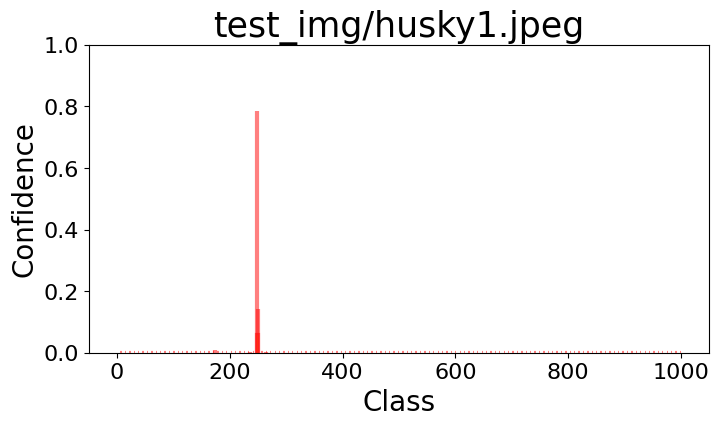

In [35]:
plt.figure(figsize=(8,4))

x = range(1000)
y = pred_softmax.cpu().detach().numpy()[0]

ax = plt.bar(x, y, alpha=0.5, width=0.3, color='yellow', edgecolor='red', lw=3)
plt.ylim([0, 1.0]) # y轴取值范围
# plt.bar_label(ax, fmt='%.2f', fontsize=15) # 置信度数值

plt.xlabel('Class', fontsize=20)
plt.ylabel('Confidence', fontsize=20)
plt.tick_params(labelsize=16) # 坐标文字大小
plt.title(img_path, fontsize=25)

plt.show()

# Take the n results with the highest confidence level

In [36]:
n = 10
top_n = torch.topk(pred_softmax, n)

In [37]:
top_n

torch.return_types.topk(
values=tensor([[7.8597e-01, 1.4126e-01, 5.8164e-02, 9.2798e-03, 2.0805e-03, 9.8181e-04,
         5.2041e-04, 4.5120e-04, 2.3985e-04, 2.3474e-04]], device='cuda:0',
       grad_fn=<TopkBackward0>),
indices=tensor([[248, 250, 249, 174, 264, 235, 227, 263, 269, 232]], device='cuda:0'))

In [38]:
# Parsing out categories
pred_ids = top_n[1].cpu().detach().numpy().squeeze()

In [39]:
pred_ids

array([248, 250, 249, 174, 264, 235, 227, 263, 269, 232])

In [40]:
# resolve the confidence level (math.)
confs = top_n[0].cpu().detach().numpy().squeeze()

In [41]:
confs

array([7.8596789e-01, 1.4126302e-01, 5.8164068e-02, 9.2798220e-03,
       2.0805190e-03, 9.8181120e-04, 5.2041258e-04, 4.5119724e-04,
       2.3984807e-04, 2.3473619e-04], dtype=float32)

In [42]:
df = pd.read_csv('imagenet_class_index.csv')

In [43]:
df

,ID,class,wordnet,Chinese
0,0,tench,n01440764,丁鲷
1,1,goldfish,n01443537,金鱼
2,2,great_white_shark,n01484850,大白鲨
3,3,tiger_shark,n01491361,虎鲨
4,4,hammerhead,n01494475,锤头鲨
...,...,...,...,...
995,995,earthstar,n13044778,地星（菌类）
996,996,hen-of-the-woods,n13052670,多叶奇果菌
997,997,bolete,n13054560,牛肝菌
998,998,ear,n13133613,玉米穗


In [44]:
idx_to_labels = {}
for idx, row in df.iterrows():
    idx_to_labels[row['ID']] = [row['wordnet'], row['class']]

In [45]:
# idx_to_labels

# Image classification results are written on the original image

In [46]:
# Load the original image from opencv
img_bgr = cv2.imread(img_path)

In [47]:
for i in range(n):
    class_name = idx_to_labels[pred_ids[i]][1] # Access to category names
    confidence = confs[i] * 100 # Getting Confidence
    text = '{:<15} {:>.4f}'.format(class_name, confidence)
    print(text)
    
    # !Image, added text, top left coordinate, font, font size, bgr colour, line width
    img_bgr = cv2.putText(img_bgr, text, (25, 50 + 40 * i), cv2.FONT_HERSHEY_SIMPLEX, 1.25, (0, 0, 255), 3)

Eskimo_dog      78.5968
Siberian_husky  14.1263
malamute        5.8164
Norwegian_elkhound 0.9280
Cardigan        0.2081
German_shepherd 0.0982
kelpie          0.0520
Pembroke        0.0451
timber_wolf     0.0240
Border_collie   0.0235


In [48]:
# Save image
cv2.imwrite('output/img_pred.jpg', img_bgr)

True

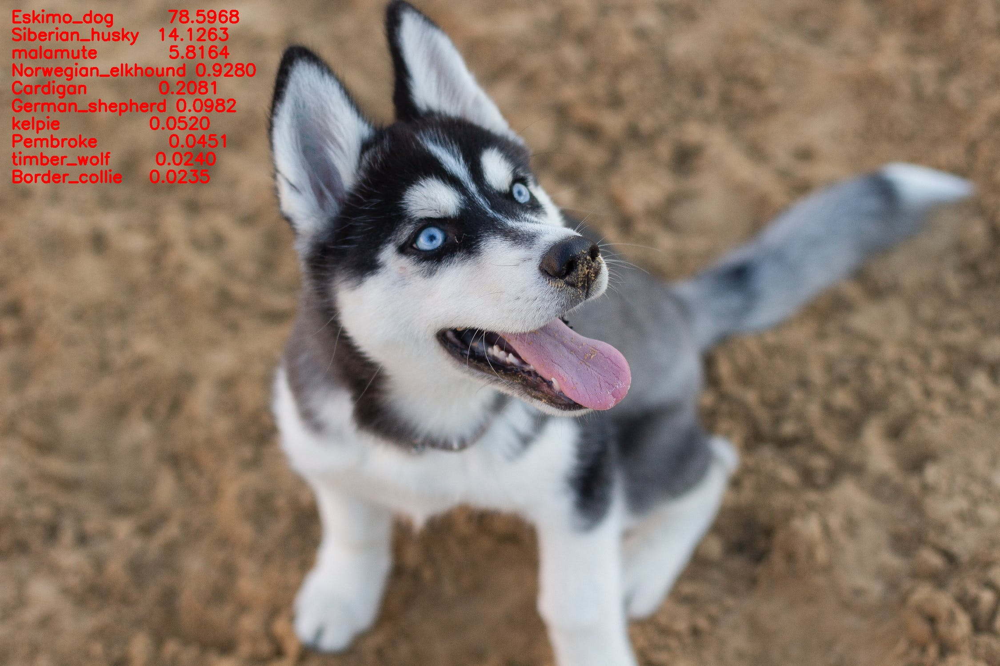

In [49]:
# Load prediction result image
img_pred = Image.open('output/img_pred.jpg')
img_pred

# Images and bar graphs are displayed together

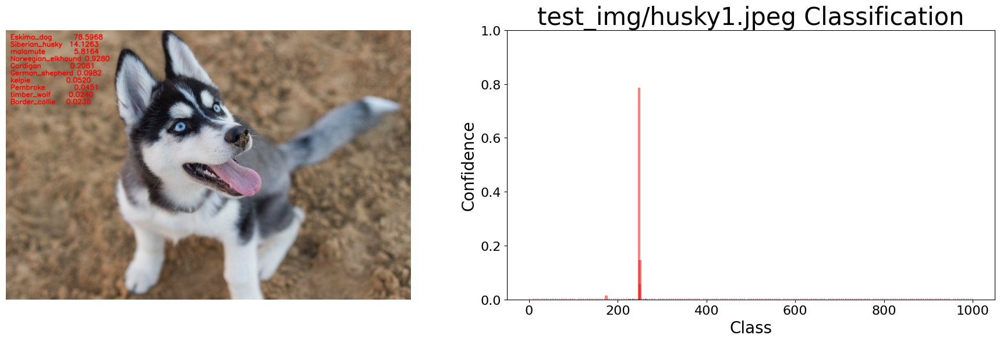

In [50]:
fig = plt.figure(figsize=(18,6))

# Plotting left-forecasting graphs
ax1 = plt.subplot(1,2,1)
ax1.imshow(img_pred)
ax1.axis('off')

# Plot right - bar chart
ax2 = plt.subplot(1,2,2)
x = df['ID']
y = pred_softmax.cpu().detach().numpy()[0]
ax2.bar(x, y, alpha=0.5, width=0.3, color='yellow', edgecolor='red', lw=3)

plt.ylim([0, 1.0]) # y-axis range
plt.title('{} Classification'.format(img_path), fontsize=30)
plt.xlabel('Class', fontsize=20)
plt.ylabel('Confidence', fontsize=20)
ax2.tick_params(labelsize=16) # Coordinate text size

plt.tight_layout()
fig.savefig('output/Forecast Chart + Bar Chart.jpg')

# Tabular output of prediction results

In [51]:
pred_df = pd.DataFrame() # Table of projected results
for i in range(n):
    class_name = idx_to_labels[pred_ids[i]][1] # Access to category names
    label_idx = int(pred_ids[i]) # Get category number
    wordnet = idx_to_labels[pred_ids[i]][0] # Get WordNet
    confidence = confs[i] * 100 # Getting Confidence
    pred_df = pred_df._append({'Class':class_name, 'Class_ID':label_idx, 'Confidence(%)':confidence, 'WordNet':wordnet}, ignore_index=True) # Add a row to the forecast results table
display(pred_df) # Presentation of the table of predicted results

,Class,Class_ID,Confidence(%),WordNet
0,Eskimo_dog,248,78.596789,n02109961
1,Siberian_husky,250,14.126302,n02110185
2,malamute,249,5.816407,n02110063
3,Norwegian_elkhound,174,0.927982,n02091467
4,Cardigan,264,0.208052,n02113186
5,German_shepherd,235,0.098181,n02106662
6,kelpie,227,0.052041,n02105412
7,Pembroke,263,0.045120,n02113023
8,timber_wolf,269,0.023985,n02114367
9,Border_collie,232,0.023474,n02106166


# ImageNetPre-trained image classification model predicts video files

In [53]:
# 安装mmcv -full
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu113/torch1.10.0/index.html

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Looking in links: https://download.openmmlab.com/mmcv/dist/cu113/torch1.10.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 607.9/607.9 kB 117.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 106.4 MB/s eta 0:00:00
  Created wheel for mmcv-full: filename=mmcv_full-1.7.2-cp310-cp310-linux_x86_64.whl size=5418210 sha256=84ad54decb418b94e9a3aad0fdc5e3cea40f262dfdd70e914a87a82f3c9255f2
  Stored in directory: /home/featurize/.cache/pip/wheels/8a/d2/fd/94d9f566e312c9630b4cfc5ab0a9ccca3d722b13efccf90986
Successfully built mmcv-full


In [55]:
import os
import time
import shutil
import tempfile
from tqdm import tqdm

import cv2
from PIL import Image

import numpy as np
import pandas as pd
import gc

import torch
import torch.nn.functional as F
from torchvision import models

import mmcv


device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device:', device)

device: cuda:0


In [56]:
# Back-end drawing, not displayed, only saved
import matplotlib
matplotlib.use('Agg')

## Load pre-trained image classification model

In [57]:
model = models.resnet18(pretrained=True)
model = model.eval()
model = model.to(device)

/environment/miniconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/environment/miniconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## Loading ImageNet 1000 image classification labels

In [58]:
df = pd.read_csv('imagenet_class_index.csv')
idx_to_labels = {}
for idx, row in df.iterrows():
    idx_to_labels[row['ID']] = [row['wordnet'], row['class']]

In [59]:
# idx_to_labels

## Image pre-processing

In [60]:
from torchvision import transforms

# Test Set Image Preprocessing - RCTN: Scaling Cropping, Turn Tensor, Normalisation
test_transform = transforms.Compose([transforms.Resize(256),
                                     transforms.CenterCrop(224),
                                     transforms.ToTensor(),
                                     transforms.Normalize(
                                         mean=[0.485, 0.456, 0.406], 
                                         std=[0.229, 0.224, 0.225])
                                    ])

## Image classification prediction function

In [61]:
def pred_single_frame(img, n=5):
    '''
    Input camera frame bgr-array, output image bgr-array of the first n image classification prediction results
    '''
    img_bgr = img
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # BGR to RGB
    img_pil = Image.fromarray(img_rgb) # array to pil
    input_img = test_transform(img_pil).unsqueeze(0).to(device) # preprocessing
    pred_logits = model(input_img) # Perform forward prediction to get logit prediction scores for all categories
    pred_softmax = F.softmax(pred_logits, dim=1) # Doing softmax on logit scores
    
    top_n = torch.topk(pred_softmax, n) # Take the n results with the highest confidence level
    pred_ids = top_n[1].cpu().detach().numpy().squeeze() # Parsing out categories
    confs = top_n[0].cpu().detach().numpy().squeeze() # resolve the confidence level (math.)
    
    # Write on the image
    for i in range(n):
        class_name = idx_to_labels[pred_ids[i]][1] # Access to category names
        confidence = confs[i] * 100 # Getting Confidence
        text = '{:<15} {:>.4f}'.format(class_name, confidence)

        # !Image, added text, top left coordinate, font, font size, bgr colour, line width
        img_bgr = cv2.putText(img_bgr, text, (25, 50 + 40 * i), cv2.FONT_HERSHEY_SIMPLEX, 1.25, (0, 0, 255), 3)
        
    return img_bgr, pred_softmax

In [62]:
input_video = 'test_img/video_3.mp4'

In [63]:
# Create a temporary folder to hold the results of each frame
temp_out_dir = time.strftime('%Y%m%d%H%M%S')
os.mkdir(temp_out_dir)
print('Create a folder {} for storing per-frame predictions'.format(temp_out_dir))

Create a folder 20240226000846 for storing per-frame predictions


In [64]:
# Read in the video to be predicted
imgs = mmcv.VideoReader(input_video)

prog_bar = mmcv.ProgressBar(len(imgs))

# Frame-by-frame processing of video
for frame_id, img in enumerate(imgs):
    
    ## Processing a single frame
    img, pred_softmax = pred_single_frame(img, n=5)

    # Save the processed frame to the /tmp directory.
    cv2.imwrite(f'{temp_out_dir}/{frame_id:06d}.jpg', img)
    
    prog_bar.update() # Update the progress bar

# String each frame into a video file
mmcv.frames2video(temp_out_dir, 'output/output_pred.mp4', fps=imgs.fps, fourcc='mp4v')

shutil.rmtree(temp_out_dir) # Delete the temporary folder where each frame is stored
print('Delete the temporary folder', temp_out_dir)

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 420/420, 53.3 task/s, elapsed: 8s, ETA:     0s[                                                  ] 0/420, elapsed: 0s, ETA:
Delete the temporary folder 20240226000846
